# AVIAN-FLU AND NEWCASTLE POULTRY DISEASE CLASSIFICATION USING DEEP CNN

    *************************************************************
    Author:  Adeyemi Adedoyin Simeon
    Program: MSc, Computer Science, University of Ibadan
    Course:  AI: Machine Learning
    Date:    25th May, 2019
    Version: 1.3
    E-mail:  adeyemi.sa1@gmail.com
    *************************************************************
    
    *Note: Please reference the author whenever and wherever you use all/portion of this code*

In [0]:
# importing libraries and packages

In [0]:
from scipy.io import loadmat
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
%matplotlib inline

import os, shutil
from os import listdir, path

# CNN keras libs
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPool2D
from keras.layers import Flatten
from keras.layers import Dense
from keras.layers import Dropout

from keras.optimizers import RMSprop
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau
from keras.callbacks import EarlyStopping

# Visualizing Model Architecture
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from keras.utils import plot_model
import pydot

# loading saved cnn model
from keras.models import load_model
from keras.preprocessing import image

# Evaluation Metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, recall_score
from sklearn.metrics import precision_score, f1_score, roc_auc_score, r2_score

In [4]:
# Connecting Google Colab to Google Drive
from google.colab import drive
drive.mount("/content/gdrive")

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
# Setting Dataset Home Path on google drive
origin_path = "/content/gdrive/My Drive/Datasets/Avian-Flu-NewCastle/"
model_path = origin_path + 'models'

# Moving Files from original folder to approriate ones

## Creating Training Set

In [0]:
try:

  # --------------------------------------------------------------------------
  # Create folder for normal birds and copy files
  # MOVING NORMAL BIRDS
  for file in listdir(path.join(origin_path, 'dataset/train/normal')):
    src_path = origin_path + 'dataset/train/normal/' + file
    dest_path = path.join(origin_path, 'dataset2/train/healthy/' + file.replace(' ', ''))
    #Copy files 
    if path.exists(dest_path) == False:
      shutil.copy(src_path, dest_path)
  
  for file in listdir(path.join(origin_path, 'dataset/validation/normal')):
    src_path = origin_path + 'dataset/validation/normal/' + file
    dest_path = path.join(origin_path, 'dataset2/validation/healthy/' + file.replace(' ', ''))
    #Copy files 
    if path.exists(dest_path) == False:
      shutil.copy(src_path, dest_path)
  
  for file in listdir(path.join(origin_path, 'dataset/test/normal')):
    src_path = origin_path + 'dataset/test/normal/' + file
    dest_path = path.join(origin_path, 'dataset2/test/healthy/' + file.replace(' ', ''))
    #Copy files 
    if path.exists(dest_path) == False:
      shutil.copy(src_path, dest_path)


  # --------------------------------------------------------------------------
  # Create folder for Avian-Flu birds and copy files
  # AVIAN-FLU
  for file in listdir(path.join(origin_path, 'dataset/train/avian_flu')):
    src_path = origin_path + 'dataset/train/avian_flu/' + file
    dest_path = path.join(origin_path, 'dataset2/train/sick/' + file.replace(' ', ''))
    #Copy files 
    if path.exists(dest_path) == False:
      shutil.copy(src_path, dest_path)
  
  for file in listdir(path.join(origin_path, 'dataset/validation/avian_flu')):
    src_path = origin_path + 'dataset/validation/avian_flu/' + file
    dest_path = path.join(origin_path, 'dataset2/validation/sick/' + file.replace(' ', ''))
    #Copy files 
    if path.exists(dest_path) == False:
      shutil.copy(src_path, dest_path)
  
  for file in listdir(path.join(origin_path, 'dataset/test/avian_flu')):
    src_path = origin_path + 'dataset/test/avian_flu/' + file
    dest_path = path.join(origin_path, 'dataset2/test/sick/' + file.replace(' ', ''))
    #Copy files 
    if path.exists(dest_path) == False:
      shutil.copy(src_path, dest_path)
    

  # --------------------------------------------------------------------------
  # Create folder for NewCastle birds and copy files
  # NEWCASTLE BIRDS
  for file in listdir(path.join(origin_path, 'dataset/train/newcastle')):
    src_path = origin_path + 'dataset/train/newcastle/' + file
    dest_path = path.join(origin_path, 'dataset2/train/sick/' + file.replace(' ', ''))
    #Copy files 
    if path.exists(dest_path) == False:
      shutil.copy(src_path, dest_path)
  
  for file in listdir(path.join(origin_path, 'dataset/validation/newcastle')):
    src_path = origin_path + 'dataset/validation/newcastle/' + file
    dest_path = path.join(origin_path, 'dataset2/validation/sick/' + file.replace(' ', ''))
    #Copy files 
    if path.exists(dest_path) == False:
      shutil.copy(src_path, dest_path)
  
  for file in listdir(path.join(origin_path, 'dataset/test/newcastle')):
    src_path = origin_path + 'dataset/test/newcastle/' + file
    dest_path = path.join(origin_path, 'dataset2/test/sick/' + file.replace(' ', ''))
    #Copy files 
    if path.exists(dest_path) == False:
      shutil.copy(src_path, dest_path)


except OSError:
  print('Something went wrong: ', OSError.strerror)

#x = plt.imread("/content/gdrive/My Drive/Datasets/Avian-Flu-NewCastle/newcastle pics/0000-main.jpg")
#plt.imshow(x)

## Viewing Filenames and Labels

In [0]:
def view_files_and_labels(folder="train"):
  # Initialize
  imageNames = list()
  labels = list()

  # Paths
  healthy_path = path.join(origin_path, 'dataset2/' + folder + '/healthy/')
  sick_path = path.join(origin_path, 'dataset2/' + folder + '/sick/')


  # Get data and label
  for file in listdir(healthy_path):
    imageNames.append(file)
    labels.append('healthy')

  for file in listdir(sick_path):
    imageNames.append(file)
    labels.append('sick')

  # Creating a dictionary of dataset
  dico = {'filename':imageNames, 'label':labels}

  # Converting dico to df
  df = pd.DataFrame(data=dico)

  return df

In [0]:
# Training, validation and test Sets summary
df_train = view_files_and_labels(folder="train")
df_valid = view_files_and_labels(folder="validation")
df_test = view_files_and_labels(folder="test")

In [0]:
print("Training Set")
print("------------")
print(f"{df_train.label.value_counts()} \n")

print("Validation Set")
print("--------------")
print(f"{df_valid.label.value_counts()} \n")

print("Testing Set")
print("------------")
print(f"{df_test.label.value_counts()}")

Training Set
------------
healthy    463
sick        54
Name: label, dtype: int64 

Validation Set
--------------
healthy    132
sick        13
Name: label, dtype: int64 

Testing Set
------------
healthy    66
sick        6
Name: label, dtype: int64


# ==================================================
# CNN CODES BEGINS FROM HERE
# ==================================================

## Model Configuration 1

In [0]:
# Initializing the CNN
cnn_classifier = Sequential()

# Adding the Convolution Layer (Conv2D_1)
cnn_classifier.add(Conv2D(filters=32, kernel_size=(5,5), 
                          input_shape=(64,64,3), activation='relu'))
# Adding the second Convolution Layer (Conv2D_2)
cnn_classifier.add(Conv2D(filters=32, kernel_size=(5,5), activation='relu'))
# Adding the Maxpooling Layer (MaxPool2D_1)
cnn_classifier.add(MaxPool2D(pool_size=(2,2), strides=(2,2)))

# Adding the third Convolution Layer (Conv2D_3)
cnn_classifier.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
# Adding the 4th Convolution Layer (Conv2D_4)
cnn_classifier.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
# Adding Maxpooling Layer (MaxPool2D_2)
cnn_classifier.add(MaxPool2D(pool_size=(2,2)))


# Step 3: Adding the Flatten Layer and then to Fully_connected ANN
cnn_classifier.add(Flatten())
cnn_classifier.add(Dense(units=256, activation='relu'))
cnn_classifier.add(Dense(units=2, activation='softmax')) # output layer

# Compiling the model
cnn_classifier.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

## Model Configuration 2

In [0]:
# Architecture [D132 + RELU D232]
model = Sequential()

model.add(Conv2D(filters = 32, kernel_size = (5,5),padding = 'Same', 
                 activation ='relu', input_shape = (64,64,3)))
model.add(Conv2D(filters = 32, kernel_size = (5,5),padding = 'Same', 
                 activation ='relu'))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Dropout(0.25)) # Randomly drops a proportion of d ntwk, to improve generalizatn n reduce over-fitting n computatn


model.add(Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same', 
                 activation ='relu'))
model.add(Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same', 
                 activation ='relu'))
model.add(MaxPool2D(pool_size=(2,2), strides=(2,2)))
model.add(Dropout(0.25))


model.add(Flatten()) # Converts nodes into a single 1-D array, to allow fully-connected ANN
model.add(Dense(256, activation = "relu")) # 'relu' = max(0, x), to introduce non-linearity 
model.add(Dropout(0.5))
model.add(Dense(2, activation = "softmax")) # 'softmax' a multiclass activation fn, uses prob distr of outputs. 
                                            # usually used at the output layer of non-binary classification problems

# Configuring optimizer
optimizer = RMSprop(lr=0.001, rho=0.9, epsilon=1e-08, decay=0.0) # Root Mean Squared Optimizer with default values
# Note: 
      # * Could have used Stochastic Gradient Descent ('sgd') optimizer instead but it is slow, and RMSprop is simple and faster
      # * 'adam' is another optimizer. An improvement of 'sgd' optimizer

# Compile the model
model.compile(optimizer = optimizer , loss = "categorical_crossentropy", metrics=["accuracy"])


# Model Architectures

## Architecture for Model1 with Configuration 1 (adam optim)

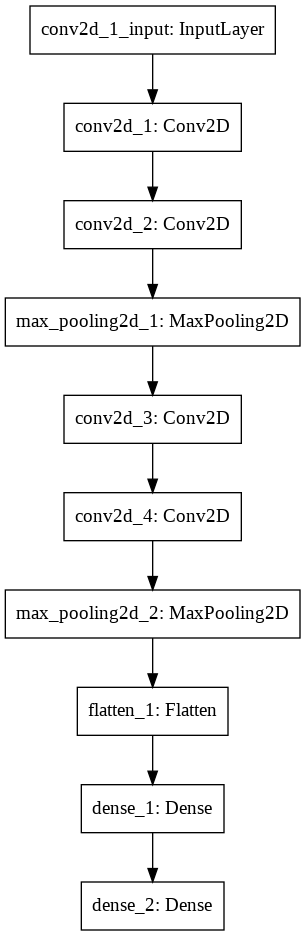

In [0]:
# Visualizing the Architecture: Method 1
# SVG(data=model_to_dot(cnn_classifier).create(prog='dot', format='svg'))

# Visualizing and Saving architecture to file using pydot: Method 2 (Better)
plot_model(model=cnn_classifier, to_file=model_path + '/cnn_avian_flu_model_config1_adam_Architecture_2nd.png')

In [0]:
# Summary
cnn_classifier.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 60, 60, 32)        2432      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 56, 56, 32)        25632     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 26, 26, 64)        18496     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 24, 24, 64)        36928     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 12, 12, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 9216)             

## Architecture for Model2 with Configuration 2 (RMSprop optim)

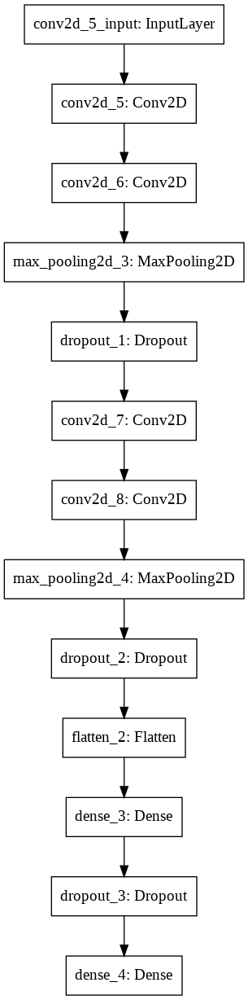

In [0]:
# Visualizing the Architecture: Method 1
#SVG(data=model_to_dot(model).create(prog='dot', format='svg'))

# Saving the above image to file using pydot: Method 2 (Better)
plot_model(model=model, to_file=model_path + '/cnn_avian_flu_model_config2_RMSprop_Architecture_2nd.png')

In [0]:
# Summary
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 64, 64, 32)        2432      
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 64, 64, 32)        25632     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 32, 32, 32)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 32, 32, 64)        18496     
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 32, 32, 64)        36928     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 16, 16, 64)       

# Image Preprocessing - Augmentation (Generation)

In [0]:
train_datagen = ImageDataGenerator(rescale=1./255, 
                                   zoom_range=0.1,
                                   shear_range=0.2,
                                   horizontal_flip=True,
                                   vertical_flip=False,  # randomly flip images
                                   featurewise_center=False,  # set input mean to 0 over the dataset
                                   samplewise_center=False,  # set each sample mean to 0
                                   featurewise_std_normalization=False,  # divide inputs by std of the dataset
                                   samplewise_std_normalization=False,  # divide each input by its std
                                   zca_whitening=False,  # apply ZCA whitening
                                   rotation_range=10,  # randomly rotate images in the range (degrees, 0 to 180)
                                   width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
                                   height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
                                   )


validation_datagen = ImageDataGenerator(rescale=1./255)

test_datagen = ImageDataGenerator(rescale=1./255)

In [9]:
# Generating the training and test data sets
# NOTE: 'target_size' should match the 'input_shape' of the convolution layer

training_set_aug_images = train_datagen.flow_from_directory(
                                            origin_path + 'dataset2/train',
                                            target_size=(64,64),
                                            batch_size=32,
                                            class_mode='categorical')

validation_set_aug_images = validation_datagen.flow_from_directory(
                                            origin_path + 'dataset2/validation',
                                            target_size=(64,64),
                                            batch_size=32,
                                            class_mode='categorical')

testing_set_aug_images = test_datagen.flow_from_directory(
                                            origin_path + 'dataset2/test',
                                            target_size=(64,64),
                                            batch_size=32,
                                            class_mode='categorical')


Found 516 images belonging to 2 classes.
Found 145 images belonging to 2 classes.
Found 72 images belonging to 2 classes.


In [0]:
total_Samples = len(training_set_aug_images.labels) + len(validation_set_aug_images.labels) + len(testing_set_aug_images.labels)
perc_train = np.round((len(training_set_aug_images.labels) / total_Samples) * 100)
perc_valid = np.round((len(validation_set_aug_images.labels) / total_Samples) * 100)
perc_test = np.round((len(testing_set_aug_images.labels) / total_Samples) * 100)

print(f'Total Training Sample: {len(training_set_aug_images.labels)}, \t Percentage: {perc_train}%')
print(f'Total Validation Sample: {len(validation_set_aug_images.labels)}, \t Percentage: {perc_valid}%')
print(f'Total Testing Sample: {len(testing_set_aug_images.labels)}, \t Percentage: {perc_test}%')

Total Training Sample: 516, 	 Percentage: 70.0%
Total Validation Sample: 145, 	 Percentage: 20.0%
Total Testing Sample: 72, 	 Percentage: 10.0%


# Training the Model

## Note: 
* I used a small size of epochs (5) because i used a CPU and this actually took up to 6 hours
* For improved predictive accuracy, the number of epochs should be set to around (100 to 150) so the model can learn more
* Use a GPU System</b> <br />


<b>ReduceLROnPlateau():</b> <br />
In order to make the optimizer converge faster and closest to the global minimum of the loss function, i used an annealing method of the learning rate (LR).

The LR is the step by which the optimizer walks through the 'loss landscape'. The higher LR, the bigger are the steps and the quicker is the convergence. However the sampling is very poor with an high LR and the optimizer could probably fall into a local minima.

Its better to have a decreasing learning rate during the training to reach efficiently the global minimum of the loss function.

To keep the advantage of the fast computation time with a high LR, i decreased the LR dynamically every X steps (epochs) depending if it is necessary (when accuracy is not improved).

With the ReduceLROnPlateau function from Keras.callbacks, i choose to reduce the LR by half if the accuracy is not improved after 3 epochs. <br /> <br />

<b>EarlyStopping():</b> <br />
In order to reduce (optimize) computational resources, i used an early-stopping mechanism to stop the learning if the validation-loss is not reduced after 5 rounds, at which point it can be assumed the model is no more learning. This can also help prevent over-fitting.

In [0]:
# NOTE: We only use 5 epochs during the training because of our limited CPU performance limitation. We are confident 
# that the model will perform more excellently with more epochs on a GPU.

# Also, due to the same device constraint, we could only train the model on a subset of the dataset. We hope to 
# improve the model later when we gain access to online GPU-based Cloud Computing facility.

n_epochs = 30

In [0]:
# Note: if error, replace 'val_accuracy' with 'val_acc'
# Seting a learning rate annealer
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)

# Setting an Early Stopper in case model does not change over many epochs
early_stopper = EarlyStopping(monitor='val_loss', min_delta=0,
                             patience=5, verbose=1, mode='auto')

In [0]:
# Fitting The cnn model with the training set
history = cnn_classifier.fit_generator(generator=training_set_aug_images, 
                                       epochs=n_epochs, 
                                       steps_per_epoch=len(training_set_aug_images.labels), 
                                       validation_data=validation_set_aug_images,
                                       validation_steps=len(validation_set_aug_images.labels),
                                       callbacks=[learning_rate_reduction, early_stopper]
                                       )


Epoch 1/30
516/516 [==============================] - 408s 790ms/step - loss: 0.0548 - accuracy: 0.9822 - val_loss: 0.8910 - val_accuracy: 0.9586
Epoch 2/30
516/516 [==============================] - 400s 775ms/step - loss: 0.0273 - accuracy: 0.9907 - val_loss: 0.0036 - val_accuracy: 0.9517
Epoch 3/30
516/516 [==============================] - 403s 781ms/step - loss: 0.0243 - accuracy: 0.9916 - val_loss: 1.4860 - val_accuracy: 0.9517
Epoch 4/30
516/516 [==============================] - 405s 785ms/step - loss: 0.0304 - accuracy: 0.9905 - val_loss: 0.0020 - val_accuracy: 0.9586

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
Epoch 5/30
516/516 [==============================] - 412s 799ms/step - loss: 0.0068 - accuracy: 0.9980 - val_loss: 2.5559 - val_accuracy: 0.9586
Epoch 6/30
516/516 [==============================] - 422s 818ms/step - loss: 0.0067 - accuracy: 0.9984 - val_loss: 0.7014 - val_accuracy: 0.9655
Epoch 7/30
516/516 [=======================

In [0]:
# Model with Configuration 2
history2 = model.fit_generator(generator=training_set_aug_images, 
                               epochs=n_epochs,
                               steps_per_epoch=len(training_set_aug_images.labels),
                               validation_data=validation_set_aug_images,
                               validation_steps=len(validation_set_aug_images.labels),
                               callbacks=[learning_rate_reduction, early_stopper]
                               )

Epoch 1/30
516/516 [==============================] - 406s 787ms/step - loss: 0.1586 - accuracy: 0.9422 - val_loss: 0.0056 - val_accuracy: 0.9586
Epoch 2/30
516/516 [==============================] - 402s 779ms/step - loss: 0.1609 - accuracy: 0.9458 - val_loss: 0.1158 - val_accuracy: 0.9586
Epoch 3/30
516/516 [==============================] - 410s 795ms/step - loss: 0.1907 - accuracy: 0.9424 - val_loss: 4.5649e-06 - val_accuracy: 0.9586
Epoch 4/30
516/516 [==============================] - 411s 796ms/step - loss: 0.1740 - accuracy: 0.9458 - val_loss: 10.2032 - val_accuracy: 0.9655
Epoch 5/30
516/516 [==============================] - 403s 781ms/step - loss: 0.1959 - accuracy: 0.9457 - val_loss: 0.0019 - val_accuracy: 0.9655
Epoch 6/30
516/516 [==============================] - 410s 794ms/step - loss: 0.1873 - accuracy: 0.9425 - val_loss: 0.0584 - val_accuracy: 0.9655
Epoch 7/30
516/516 [==============================] - 405s 785ms/step - loss: 0.1874 - accuracy: 0.9394 - val_loss: 0.2

# Evaluating Trained Models

In [0]:
scores1 = cnn_classifier.evaluate_generator(generator=testing_set_aug_images, steps=len(testing_set_aug_images.labels), verbose=2)
scores2 = model.evaluate_generator(generator=testing_set_aug_images, steps=len(testing_set_aug_images.labels), verbose=2)

# Displaying Evaluation Result
print("SCORES OF EVALUATING TEST SET ON EACH THE MODELS")
print('-------------------------------------------------\n')
print(f"Evaluation of model 1 with Config 1: \t\t (loss = {np.round(scores1[0], 5)} \t accuracy = {np.round(scores1[1] * 100, 1)}%)")
print(f"Evaluation of model 2 with Config 2: \t\t (loss = {np.round(scores2[0], 5)} \t accuracy = {np.round(scores2[1] * 100, 1)}%)")

SCORES OF EVALUATING TEST SET ON EACH THE MODELS
-------------------------------------------------

Evaluation of model 1 with Config 1: 		 (loss = 0.0 	 accuracy = 95.8%)
Evaluation of model 2 with Config 2: 		 (loss = 0.0 	 accuracy = 97.2%)


# Saving the Trained Model

In [0]:
cnn_classifier.save(model_path + '/model3_sick_config1_adam_2nd.h5')
model.save(model_path + '/model4_sick_config2_RMSprop_2nd.h5')


## Summary of the Training Result

In [0]:
# Details of the Training
model_config1_training_info = pd.DataFrame(history.history) # cnn_classifier
model_config2_training_info = pd.DataFrame(history2.history) # model

In [0]:
# model with Configuration 1 (adams optimizer)
print('Model Config 1 Training Summary.\n')
model_config1_training_info

Model Config 1 Training Summary.



,val_loss,val_accuracy,loss,accuracy,lr
0,0.890950,0.958621,0.055766,0.982230,0.001000
1,0.003608,0.951724,0.027698,0.990748,0.001000
2,1.486001,0.951724,0.025258,0.991577,0.001000
3,0.002011,0.958621,0.031177,0.990476,0.001000
4,2.555923,0.958621,0.007149,0.997958,0.000500
5,0.701436,0.965517,0.006995,0.998405,0.000500
6,0.008095,0.951724,0.009949,0.996810,0.000500
7,0.502965,0.958621,0.009852,0.996804,0.000500
8,0.000013,0.965517,0.006828,0.997894,0.000500
9,0.100766,0.958621,0.003072,0.998722,0.000250


In [0]:
# model with Configuration 2 (RMSprop() [Root Mean Squared] optimizer)
print('Model Config 2 Training Summary.\n')
model_config2_training_info

Model Config 2 Training Summary.



,val_loss,val_accuracy,loss,accuracy,lr
0,0.005576,0.958621,0.160806,0.942150,0.0010
1,0.115847,0.958621,0.163533,0.945827,0.0010
2,0.000005,0.958621,0.191569,0.942381,0.0010
3,10.203204,0.965517,0.177489,0.945763,0.0010
4,0.001878,0.965517,0.197006,0.945666,0.0010
5,0.058367,0.965517,0.194847,0.942509,0.0010
6,0.261231,0.965517,0.186950,0.939402,0.0010
7,0.009567,0.979310,0.116254,0.963055,0.0005


In [0]:
print("FINAL TRAINING RESULT OF THE TWO  MODELS' CONFIGURATIONS")
print('************************************************************\n')
print(f"Model with Configuration 1 (adam Optim.): \t  after {len(model_config1_training_info)} epochs :\t Validation_Accuracy = {np.round(model_config1_training_info.iloc[-1]['val_accuracy'] * 100, 2)}%")
print(f"Model with Configuration 2 (RMSprop Optim.): \t  after {len(model_config2_training_info)} epochs :\t Validation_Accuracy = {np.round(model_config2_training_info.iloc[-1]['val_accuracy'] * 100, 2)}%")

FINAL TRAINING RESULT OF THE TWO  MODELS' CONFIGURATIONS
************************************************************

Model with Configuration 1 (adam Optim.): 	  after 14 epochs :	 Validation_Accuracy = 95.17%
Model with Configuration 2 (RMSprop Optim.): 	  after 8 epochs :	 Validation_Accuracy = 97.93%


### Visualizing the Training Result

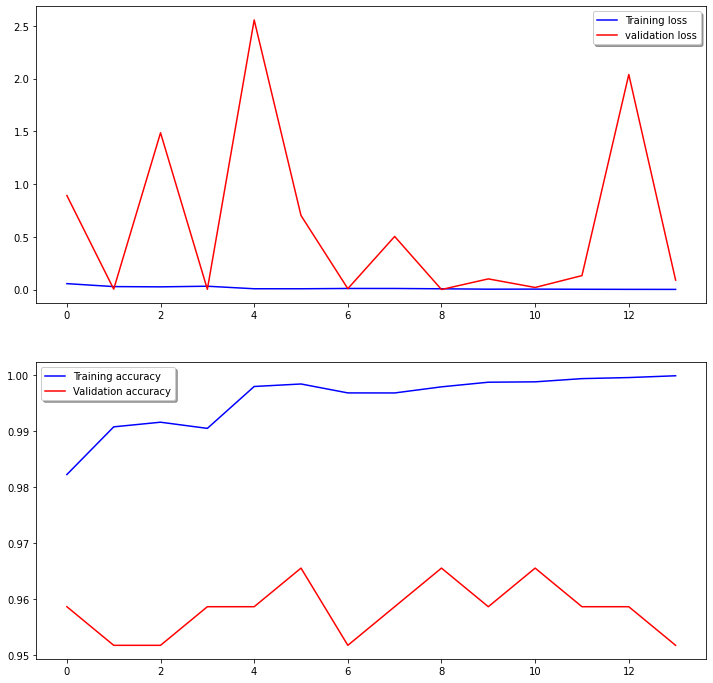

In [0]:
plt.figure(num=2, figsize=(12,12))
#fig, ax = plt.subplots(1,2)
ax1 = plt.subplot(2,1,1)
ax2 = plt.subplot(2,1,2)
ax1.plot(history.history['loss'], color='b', label="Training loss")
ax1.plot(history.history['val_loss'], color='r', label="validation loss", axes=ax1)
legend = ax1.legend(loc='best', shadow=True)

# Note: if error, replace 'val_accuracy' with 'val_acc' and 'accuracy' with 'acc'
ax2.plot(history.history['accuracy'], color='b', label="Training accuracy")
ax2.plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = ax2.legend(loc='best', shadow=True)

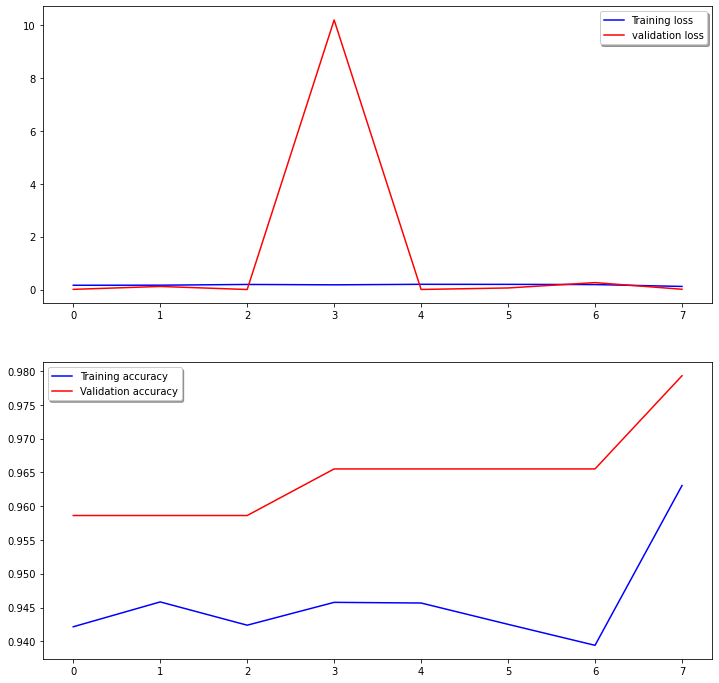

In [0]:

plt.figure(num=2, figsize=(12,12))
#fig, ax = plt.subplots(1,2)
ax1 = plt.subplot(2,1,1)
ax2 = plt.subplot(2,1,2)

ax1.plot(history2.history['loss'], color='b', label="Training loss")
ax1.plot(history2.history['val_loss'], color='r', label="validation loss")
legend = ax1.legend(loc='best', shadow=True)

# Note: if error, replace 'val_accuracy' with 'val_acc' and 'accuracy' with 'acc'
ax2.plot(history2.history['accuracy'], color='b', label="Training accuracy")
ax2.plot(history2.history['val_accuracy'], color='r',label="Validation accuracy")
legend = ax2.legend(loc='best', shadow=True)


Text(0, 0.5, 'Accuracy')

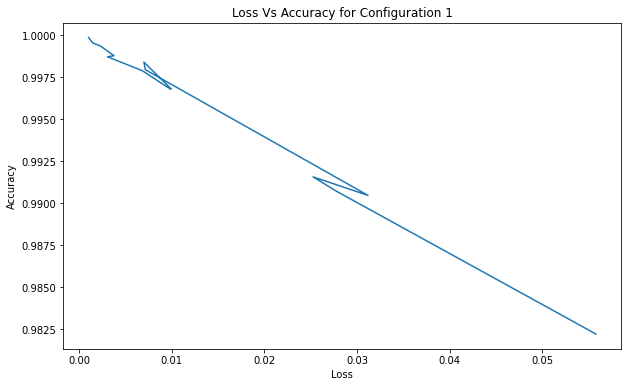

In [0]:
# Loss Vs Accuracy: Config 1
x_ticks = np.linspace(np.min(model_config1_training_info.loss) - 0.001,
                      np.max(model_config1_training_info.loss) + 0.001,
                      num=n_epochs)

y_ticks = np.linspace(np.min(model_config1_training_info.accuracy) - 0.001,
                      np.max(model_config1_training_info.accuracy) + 0.001,
                      num=n_epochs)

plt.figure(figsize=(10, 6))
plt.plot(model_config1_training_info.loss, model_config1_training_info.accuracy)
plt.x_ticks = x_ticks
plt.y_ticks = y_ticks
plt.title('Loss Vs Accuracy for Configuration 1')
plt.xlabel('Loss')
plt.ylabel('Accuracy')

Text(0, 0.5, 'Accuracy')

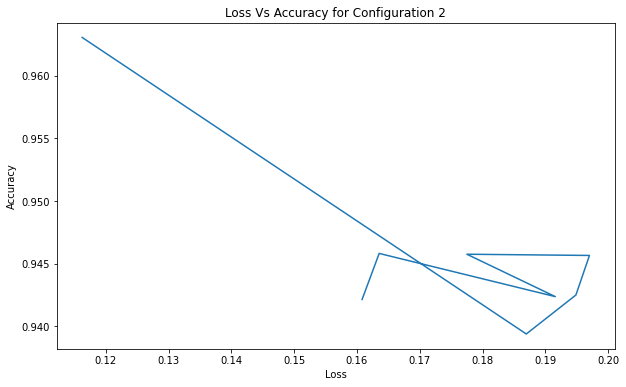

In [0]:
# Loss Vs Accuracy: Config 2
x_ticks = np.linspace(np.min(model_config2_training_info.loss) - 0.001,
                      np.max(model_config2_training_info.loss) + 0.001,
                      num=n_epochs)

y_ticks = np.linspace(np.min(model_config2_training_info.accuracy) - 0.001,
                      np.max(model_config2_training_info.accuracy) + 0.001,
                      num=n_epochs)

plt.figure(figsize=(10, 6))
plt.plot(model_config2_training_info.loss, model_config2_training_info.accuracy)
plt.x_ticks = x_ticks
plt.y_ticks = y_ticks
plt.title('Loss Vs Accuracy for Configuration 2')
plt.xlabel('Loss')
plt.ylabel('Accuracy')

1

# Loading Saved Models from Disk

In [0]:
model1 = load_model(model_path + '/model3_sick_config1_adam_2nd.h5')
model2 = load_model(model_path + '/model4_sick_config2_RMSprop_2nd.h5')


# Model Predictions and Evaluations

## Some Useful Functions

In [0]:
def load_image(img_path, show=False):
  img = image.load_img(img_path,target_size=(64,64),color_mode='rgb')
    
  #(height,width,channels)
  img_tensor = image.img_to_array(img)                                        
    
  #img_tensor = np.vstack([img_tensor])
    
  #(1,height,width,channels), adds a dim coz model expects shape: (batch_size,height,width,channels)
  img_tensor = np.expand_dims(img_tensor,axis=0)     
    
  #imshow expects values in range[0,1]
  img_tensor = img_tensor / 255.
    
  if show:
    plt.imshow(img_tensor[0])
    plt.axis('off')
    plt.show()
    
  return img_tensor


def get_class_value(x):
  if type(x) == list:
    classes = []
    for label in x:
      if label == 0:
        classes.append('healthy')
      elif label == 1:
        classes.append('sick')
    
    return classes
  
  else:
      if x == 0:
        return 'healthy'
      elif x == 1:
        return 'sick'


def get_labels(paths):
  labels = []
  for path in paths:
    classes = path.split("/")[-2]
    if classes == 'healthy':
      labels.append(0)
    elif classes == 'sick':
      labels.append(1)

  return labels


In [0]:
def predict(model, data, y_true=None, kind='augumented', limit=0, show=False):
  """
  Predicts the class(es) of image(s) in 'data' using 'model' and returns a dictionary object.
  Arguments:
  ----------
  model (cnn model): model predict with
  data (str or augmented_image_obj): A file path or an augmented image object:
  kind (str):  Specifies the type of 'data' passed. 
  limit(int): The number of images to predict from given list of paths (< size of data)
  show (bool): Determines whether the Images should be shown (will always show if kind='single')
    Value: 
      * Can be any of {'augumented' / 'single' / 'multiple'}, defaults to 'augumented'. 
      * Set to 'single' if data is an image path,  
      * set to 'multiple' if data is a list of images paths
      
  """
  
  # Initialize predictions
  predictions = {'pred_labels':[],  'true_labels':[], 'pred_values':[],'true_values':[]}

  if kind == 'augumented':
    predictions = predict_from_aug_obj(model, data, limit, show=show)
  elif kind == 'single':
    predictions = predict_single(model, data)
  elif kind == 'multiple':
    predictions = predict_multiple(model, data, y_true, limit, show=show)
   
  
  return predictions


def predict_from_aug_obj(model, aug_img_set_obj, limit=0, show=False):
  # result template
  #result = {'pred_labels':[], 'True_labels':true_lbls, 'pred_values':pred_vals, 'True_values':true_vals}
  pred_lbls = []
  pred_vals = []
  true_lbls = []
  true_vals = []

  if limit <= 0 or limit > len(aug_img_set_obj.filepaths):
    file_paths = aug_img_set_obj.filepaths
  else:
    file_paths = aug_img_set_obj.filepaths[:limit]

  if show:
    rows = len(file_paths) // 4
    if len(file_paths) % 4 != 0:
      rows += 1

    plt.figure(num=len(file_paths), figsize=(20, 4 * rows))

  for i,img_path in enumerate(file_paths):    
    # Converting the Image to array and predict
    new_image = load_image(img_path)
    predicted = model.predict_classes(new_image)

    # Showing Prediction details
    classes = [key for key in aug_img_set_obj.class_indices]
    predicted_value = classes[predicted[0]]
    actual_value = classes[aug_img_set_obj.labels[i]]

    if show:
      img_data = plt.imread(img_path)
      plt.subplot(rows, 4, i+1)
      #ax[row, col].imshow(img_data)
      plt.imshow(img_data)
      #plt.title("Pred. :{} True :{}".format(predicted[0], aug_img_set_obj.labels[i]))
      plt.axis('off')
      plt.title("Predicted : {} ({}) \nActual : {} ({})".format(predicted[0], 
                                                                predicted_value,
                                                                aug_img_set_obj.labels[i],
                                                                actual_value))

    # Add predicted label to predictions
    pred_lbls.append(predicted[0])
    pred_vals.append(predicted_value)
    true_lbls.append(aug_img_set_obj.labels[i])
    true_vals.append(actual_value)

  return {'pred_labels':pred_lbls, 'true_labels':true_lbls, 'pred_values':pred_vals, 'true_values':true_vals}


def predict_multiple(model, img_paths, y_true=None, limit=0, show=False):
  pred_lbls = []
  pred_vals = []
  is_y_true_avail = False
  if y_true is not None and type(y_true) == list:
    if len(img_paths) == len(y_true):
      is_y_true_avail = True

  if limit <= 0 or limit > len(img_paths):
    file_paths = img_paths
  else:
    file_paths = img_paths[:limit]

  if show:
    rows = len(file_paths) // 4
    if len(file_paths) % 4 != 0:
      rows += 1
    # Initialize plot to 20 width and (4 x rows) height (4 for each pix)
    plt.figure(num=len(file_paths), figsize=(20, 4 * rows))
    
  for i, path in enumerate(file_paths):
    new_image = load_image(path)  
    predicted = model.predict_classes(new_image)
    pred_lbls.append(predicted[0])
    pred_vals.append(get_class_value(predicted[0]))

    if show:
      # Show Image
      img_data = plt.imread(path)
      plt.subplot(rows, 4, i+1)
      plt.imshow(img_data)
      #plt.title("Pred. :{} True :{}".format(predicted[0], aug_img_set_obj.labels[i]))
      plt.axis('off')
      if is_y_true_avail == True:
        plt.title("Predicted : {} ({}) \nActual : {} ({})".format(predicted[0], 
                                                                get_class_value(predicted[0]),
                                                                y_true[i],
                                                                get_class_value(y_true[i])))
      else:
        plt.title('Predicted: {} ({})'.format(predicted[0], get_class_value(predicted[0])))
  
  result = {'pred_labels':pred_lbls, 'true_labels':[], 'pred_values':pred_vals, 'true_values':[]}
  if is_y_true_avail == True:
    result = {'pred_labels':pred_lbls, 'true_labels':y_true, 'pred_values':pred_vals, 'true_values':get_class_value(y_true)}
  return result


def predict_single(model, img_path):
  new_image = load_image(img_path)  
  predicted = model.predict_classes(new_image)
  class_val = get_class_value(predicted[0])

  # Show Image
  img_data = plt.imread(img_path)
  plt.imshow(img_data)
  plt.title(f'Pred.: {predicted[0]} ({class_val})')
  plt.axis('off')

  return {'pred_labels':[predicted[0]], 'true_labels':[], 'pred_values':[class_val], 'true_values':[]}

def predict_multiple_v2(model, data, limit=0):
  pred_labels = []
  pred_values = []

  if limit <= 0 or limit > len(data):
    file_paths = data
  else:
    file_paths = data[:limit]

  for path in file_paths:
    result = predict_single(model, path)
    pred_labels.append(result["pred_labels"][0])
    pred_values.append([result["pred_values"][0]])
  
  return {'pred_labels':pred_labels, 'true_labels':[], 'pred_values':pred_values, 'true_values':[]}


NoneType

# Evaluating the Trained Models Prediction with the Test Set

## Loading Testset Data

In [18]:
# Loading Testing Set data
test_datagen = ImageDataGenerator(rescale=1./255)

testing_set_aug_images = test_datagen.flow_from_directory(
                                            origin_path + 'dataset2/test',
                                            target_size=(64,64),
                                            batch_size=32,
                                            class_mode='categorical')

print(f'\nClass Indices: \n{testing_set_aug_images.class_indices}\n')
print(f'True Labels: \n{testing_set_aug_images.labels}')

True_labels = testing_set_aug_images.labels
#test_set_paths = testing_set_aug_images.filenames
#test_set_paths = testing_set_aug_images.filepaths

Found 72 images belonging to 2 classes.

Class Indices: 
{'healthy': 0, 'sick': 1}

True Labels: 
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1]


In [0]:
scores1 = model1.evaluate_generator(generator=testing_set_aug_images, steps=len(testing_set_aug_images.labels), verbose=2)
scores2 = model2.evaluate_generator(generator=testing_set_aug_images, steps=len(testing_set_aug_images.labels), verbose=2)


In [0]:
# Displaying Evaluation Result
print("SCORES OF EVALUATING TEST SET ON EACH OF THE MODELS")
print('-------------------------------------------------\n')
print(f"Evaluation of model 1 with Config 1: \t\t (loss = {np.round(scores1[0], 5)} \t\t accuracy = {np.round(scores1[1] * 100, 1)}%)")
print(f"Evaluation of model 2 with Config 2: \t\t (loss = {np.round(scores2[0], 5)} \t accuracy = {np.round(scores2[1] * 100, 1)}%)")

SCORES OF EVALUATING TEST SET ON EACH OF THE MODELS
-------------------------------------------------

Evaluation of model 1 with Config 1: 		 (loss = 0.0 		 accuracy = 95.8%)
Evaluation of model 2 with Config 2: 		 (loss = 0.00013 	 accuracy = 97.2%)


## Predicting the Test Set

In [0]:
pred_test_model1 = predict(model=model1, data=testing_set_aug_images, kind='augumented', limit=0, show=False)
pred_test_model2 = predict(model=model2, data=testing_set_aug_images, kind='augumented', limit=0, show=False)


In [0]:
y_true_test = testing_set_aug_images.labels.tolist()
y_pred_test_model1 = pred_test_model1['pred_labels']
y_pred_test_model2 = pred_test_model2['pred_labels']

In [15]:
len(y_true_test)

72

Evaluation Metrics (Model 1)
----------------------------

Accuracy: 	 0.958
Recall: 	 0.5
Precision: 	 1.0
F1-Score: 	 0.667




Text(33.0, 0.5, 'True Label')

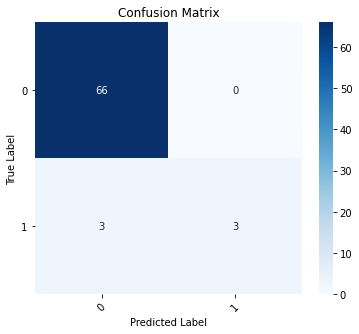

In [16]:
print("Evaluation Metrics (Model 1)")
print('----------------------------\n')
print('Accuracy: \t', np.round(accuracy_score(y_true_test, y_pred_test_model1), 3))
print('Recall: \t', np.round(recall_score(y_true_test, y_pred_test_model1), 3))
print('Precision: \t', np.round(precision_score(y_true_test, y_pred_test_model1), 3))
print('F1-Score: \t', np.round(f1_score(y_true_test, y_pred_test_model1), 3))
#print('ROC_AUC: \t', roc_auc_score(y_true, y_pred_test_model1, 'ovr'))

print("\n")
conf_mat = confusion_matrix(y_true_test, y_pred_test_model1)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")

Evaluation Metrics (Model 2)
----------------------------

Accuracy: 	 0.972
Recall: 	 0.667
Precision: 	 1.0
F1-Score: 	 0.8




Text(33.0, 0.5, 'True Label')

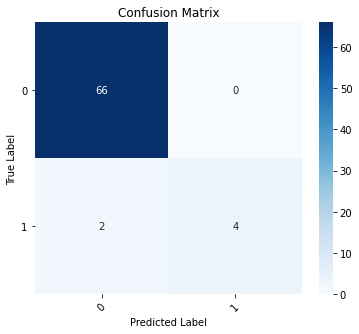

In [0]:
print("Evaluation Metrics (Model 2)")
print('----------------------------\n')

print('Accuracy: \t', np.round(accuracy_score(y_true_test, y_pred_test_model2), 3))
print('Recall: \t', np.round(recall_score(y_true_test, y_pred_test_model2), 3))
print('Precision: \t', np.round(precision_score(y_true_test, y_pred_test_model2), 3))
print('F1-Score: \t', np.round(f1_score(y_true_test, y_pred_test_model2), 3))
#print('ROC_AUC: \t', roc_auc_score(y_true, y_pred_test_model1, 'ovr'))

print("\n")
conf_mat = confusion_matrix(y_true_test, y_pred_test_model2)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")


# More Predictions

In [17]:
img_path1 = origin_path + 'dataset2/test/sick/'
img_path2 = origin_path + 'dataset2/validation/sick/'
img_path3 = origin_path + 'dataset2/train/sick/'

temp_images = [img_path1 + path for path in listdir(img_path1)]
temp_images.extend([img_path2 + path for path in listdir(img_path2)])
temp_images.extend([img_path3 + path for path in listdir(img_path3)])
print(f'Number of Sick Birds Images to test: \t {len(temp_images)}')

Number of Sick Birds Images to test: 	 73


In [18]:
temp_images[:5]

['/content/gdrive/My Drive/Datasets/Avian-Flu-NewCastle/dataset2/test/sick/hredirect2(1).jpg',
 '/content/gdrive/My Drive/Datasets/Avian-Flu-NewCastle/dataset2/test/sick/image11.jpeg',
 '/content/gdrive/My Drive/Datasets/Avian-Flu-NewCastle/dataset2/test/sick/image3.jpeg',
 '/content/gdrive/My Drive/Datasets/Avian-Flu-NewCastle/dataset2/test/sick/images39.jpg',
 '/content/gdrive/My Drive/Datasets/Avian-Flu-NewCastle/dataset2/test/sick/5538129415.jpg']

In [0]:
# PREDICTIONS
print(f'\nClass Indices: \n{testing_set_aug_images.class_indices}\n')

pred_results = predict(model=model1, data=temp_images, kind='multiple')
pred_results2 = predict(model=model2, data=temp_images, kind='multiple')

# [p.split("/")[0] for p in testing_set_aug_images.filenames[30:70]]


Class Indices: 
{'healthy': 0, 'sick': 1}



## Evaluation Metrics of Predicted Images

In [0]:
y_true =  np.ones((len(temp_images)), dtype=np.int64).tolist()
y_pred_model1 = pred_results['pred_labels']
y_pred_model2 = pred_results2['pred_labels']

Evaluation Metrics (Model 1)
----------------------------

Accuracy: 	 0.981
Recall: 	 0.863
Precision: 	 1.0
F1-Score: 	 0.926




Text(33.0, 0.5, 'True Label')

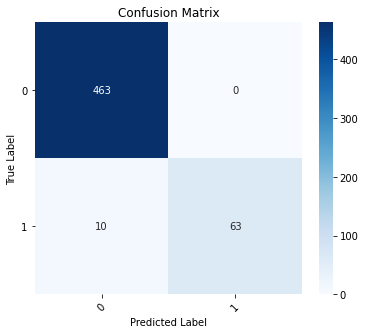

In [0]:
print("Evaluation Metrics (Model 1)")
print('----------------------------\n')

print('Accuracy: \t', np.round(accuracy_score(y_true, y_pred_model1), 3))
print('Recall: \t', np.round(recall_score(y_true, y_pred_model1), 3))
print('Precision: \t', np.round(precision_score(y_true, y_pred_model1), 3))
print('F1-Score: \t', np.round(f1_score(y_true, y_pred_model1), 3))
#print('ROC_AUC: \t', roc_auc_score(y_true, y_pred, 'ovr'))

print("\n")
conf_mat = confusion_matrix(y_true, y_pred_model1)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")


Evaluation Metrics (Model 2)
----------------------------

Accuracy: 	 0.983
Recall: 	 0.932
Precision: 	 0.944
F1-Score: 	 0.938




Text(33.0, 0.5, 'True Label')

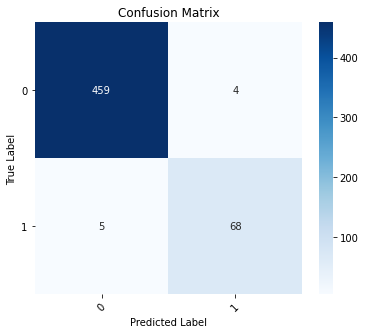

In [0]:
print("Evaluation Metrics (Model 2)")
print('----------------------------\n')

print('Accuracy: \t', np.round(accuracy_score(y_true, y_pred_model2), 3))
print('Recall: \t', np.round(recall_score(y_true, y_pred_model2), 3))
print('Precision: \t', np.round(precision_score(y_true, y_pred_model2), 3))
print('F1-Score: \t', np.round(f1_score(y_true, y_pred_model2), 3))
#print('ROC_AUC: \t', roc_auc_score(y_true, y_pred, 'ovr'))

print("\n")
conf_mat = confusion_matrix(y_true, y_pred_model2)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")



# More Predictions

In [19]:
img_path1 = origin_path + 'dataset2/test/sick/'
img_path2 = origin_path + 'dataset2/validation/sick/'
img_path3 = origin_path + 'dataset2/train/sick/'
img_path4 = origin_path + 'dataset2/train/healthy/'

temp_images = [img_path1 + path for path in listdir(img_path1)]
temp_images.extend([img_path2 + path for path in listdir(img_path2)])
temp_images.extend([img_path3 + path for path in listdir(img_path3)])
temp_images.extend([img_path4 + path for path in listdir(img_path4)[:73]])
print(f'Number of Bird Images to test: \t {len(temp_images)}')

Number of Bird Images to test: 	 146


In [0]:
# Adding their true labels
temp_images_lbl = np.ones(73, dtype=np.int).tolist()
temp_images_lbl.extend(np.zeros(73, dtype=np.int).tolist())

dico = {'images':temp_images,'labels':temp_images_lbl}
data_input = pd.DataFrame(data=dico)

In [43]:
# PREDICTIONS
print(f'\nClass Indices: \n{testing_set_aug_images.class_indices}\n')

pred_results = predict(model=model1, data=list(data_input.images), y_true=list(data_input.labels), kind='multiple')
pred_results2 = predict(model=model2, data=list(data_input.images), y_true=list(data_input.labels), kind='multiple')

# [p.split("/")[0] for p in testing_set_aug_images.filenames[30:70]]

y_true =  get_labels(temp_images)
y_pred_model1 = pred_results['pred_labels']
y_pred_model2 = pred_results2['pred_labels']


Class Indices: 
{'healthy': 0, 'sick': 1}



	PERFORMANCE EVALUATION (Model 1)
	********************************

		Classification Report
		---------------------
               precision    recall  f1-score   support

           0       0.88      1.00      0.94        73
           1       1.00      0.86      0.93        73

    accuracy                           0.93       146
   macro avg       0.94      0.93      0.93       146
weighted avg       0.94      0.93      0.93       146


		Evaluation Metrics
		-------------------

		Accuracy: 	 0.932
		Recall: 	 0.863
		Precision: 	 1.0
		F1-Score: 	 0.926
		R2-Score: 	 0.726


		Confusion Matrix
		----------------



Text(33.0, 0.5, 'True Label')

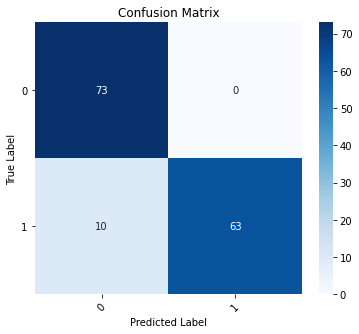

In [80]:
print("\tPERFORMANCE EVALUATION (Model 1)")
print('\t********************************\n')
print('\t\tClassification Report\n\t\t---------------------\n', classification_report(y_true, y_pred_model1))
print('\n\t\tEvaluation Metrics\n\t\t-------------------\n')
print('\t\tAccuracy: \t', np.round(accuracy_score(y_true, y_pred_model1), 3))
print('\t\tRecall: \t', np.round(recall_score(y_true, y_pred_model1), 3))
print('\t\tPrecision: \t', np.round(precision_score(y_true, y_pred_model1), 3))
print('\t\tF1-Score: \t', np.round(f1_score(y_true, y_pred_model1), 3))
print('\t\tR2-Score: \t', np.round(r2_score(y_true, y_pred_model1), 3))
#print('ROC_AUC: \t', roc_auc_score(y_true, y_pred, 'ovr'))

print("\n")
print('\t\tConfusion Matrix\n\t\t----------------\n')
conf_mat = confusion_matrix(y_true, y_pred_model1)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")


	PERFORMANCE EVALUATION (Model 2)
	********************************

		Classification Report
		---------------------
               precision    recall  f1-score   support

           0       0.94      1.00      0.97        73
           1       1.00      0.93      0.96        73

    accuracy                           0.97       146
   macro avg       0.97      0.97      0.97       146
weighted avg       0.97      0.97      0.97       146


		Evaluation Metrics
		-------------------

		Accuracy: 	 0.966
		Recall: 	 0.932
		Precision: 	 1.0
		F1-Score: 	 0.965
		R2-Score: 	 0.863


		Confusion Matrix
		----------------



Text(33.0, 0.5, 'True Label')

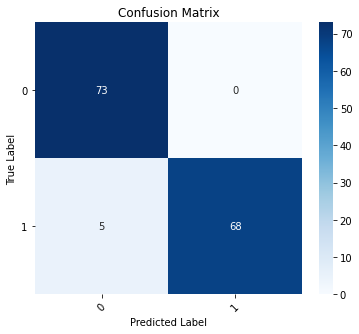

In [79]:
print("\tPERFORMANCE EVALUATION (Model 2)")
print('\t********************************\n')
print('\t\tClassification Report\n\t\t---------------------\n', classification_report(y_true, y_pred_model2))
print('\n\t\tEvaluation Metrics\n\t\t-------------------\n')
print('\t\tAccuracy: \t', np.round(accuracy_score(y_true, y_pred_model2), 3))
print('\t\tRecall: \t', np.round(recall_score(y_true, y_pred_model2), 3))
print('\t\tPrecision: \t', np.round(precision_score(y_true, y_pred_model2), 3))
print('\t\tF1-Score: \t', np.round(f1_score(y_true, y_pred_model2), 3))
print('\t\tR2-Score: \t', np.round(r2_score(y_true, y_pred_model2), 3))
#print('ROC_AUC: \t', roc_auc_score(y_true, y_pred, 'ovr'))

print("\n")
print('\t\tConfusion Matrix\n\t\t----------------\n')
conf_mat = confusion_matrix(y_true, y_pred_model2)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")

## Comparing Results

In [81]:
metrics = ['Accuracy', 'Recall', 'Precision', 'F-Score', 'R2-Score']
res_model1 = [np.round(accuracy_score(y_true, y_pred_model1), 3),
              np.round(recall_score(y_true, y_pred_model1), 3),
              np.round(precision_score(y_true, y_pred_model1), 3),
              np.round(f1_score(y_true, y_pred_model1), 3),
              np.round(r2_score(y_true, y_pred_model1), 3)
              ]

res_model2 = [np.round(accuracy_score(y_true, y_pred_model2), 3),
              np.round(recall_score(y_true, y_pred_model2), 3),
              np.round(precision_score(y_true, y_pred_model2), 3),
              np.round(f1_score(y_true, y_pred_model2), 3),
              np.round(r2_score(y_true, y_pred_model2), 3)
              ]
dico = {'Model1':res_model1, 'Model2':res_model2}
df_test_results1 = pd.DataFrame(data=dico, index=metrics)
df_test_results1

,Model1,Model2
Accuracy,0.932,0.966
Recall,0.863,0.932
Precision,1.000,1.000
F-Score,0.926,0.965
R2-Score,0.726,0.863


Text(0, 0.5, 'SCORES')

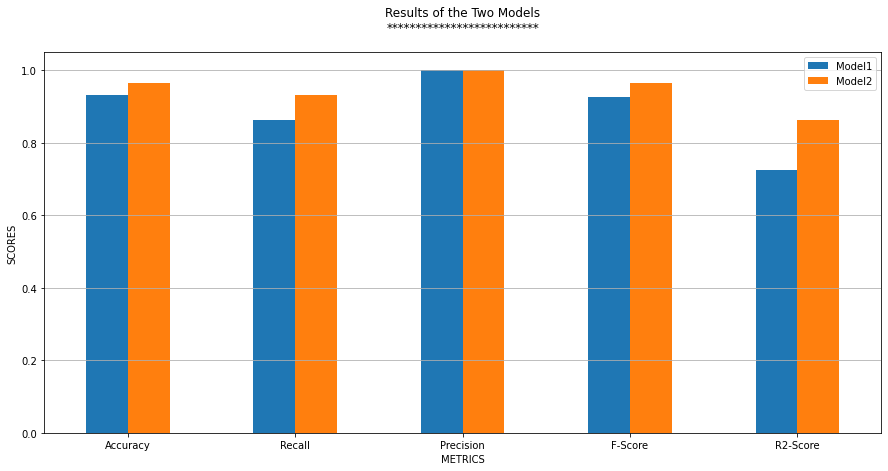

In [98]:
df_test_results1.plot.bar(figsize=(15,7), 
                          title='Results of the Two Models\n**************************\n', 
                          rot=0, 
                          grid=True)
plt.grid(axis='x')
plt.xlabel('METRICS')
plt.ylabel('SCORES')

# Visualized Predictions



					MODEL 1 PREDICTIONS
					*******************

		EVALUATION: 	Accuracy: 1.0,	Recall: 1.0,	Precision: 1.0,	F1-Score: 1.0,	R2-Score: 1.0


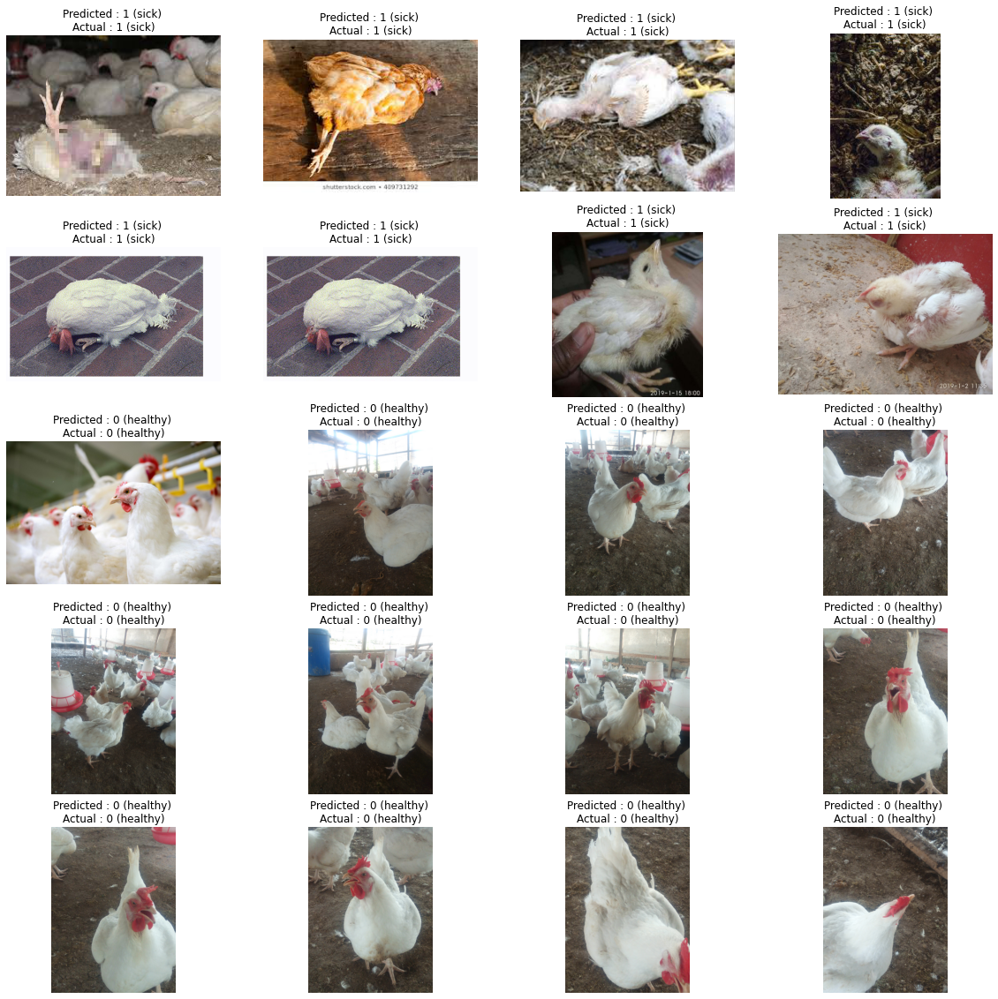

In [99]:
pred = predict(model1, data=temp_images[65:85], y_true=get_labels(temp_images[65:85]), kind="multiple", limit=0, show=True)
y_pred = pred['pred_labels']
y_true = pred['true_labels']

print("\n")
print("\t\t\t\t\tMODEL 1 PREDICTIONS")
print("\t\t\t\t\t*******************\n")
print('\t\tEVALUATION: ', end='\t')
print(f'Accuracy: {np.round(accuracy_score(y_true, y_pred), 2)}', end=',\t')
print(f'Recall: {np.round(recall_score(y_true, y_pred), 2)}', end=',\t')
print(f'Precision: {np.round(precision_score(y_true, y_pred), 2)}', end=',\t')
print(f'F1-Score: {np.round(f1_score(y_true, y_pred), 2)}', end=',\t')
print(f'R2-Score: {np.round(r2_score(y_true, y_pred), 2)}')
#print('ROC_AUC: \t', roc_auc_score(y_true, y_pred, 'ovr'))



					MODEL 2 PREDICTIONS
					*******************

		EVALUATION: 	Accuracy: 1.0,	Recall: 1.0,	Precision: 1.0,	F1-Score: 1.0,	R2-Score: 1.0


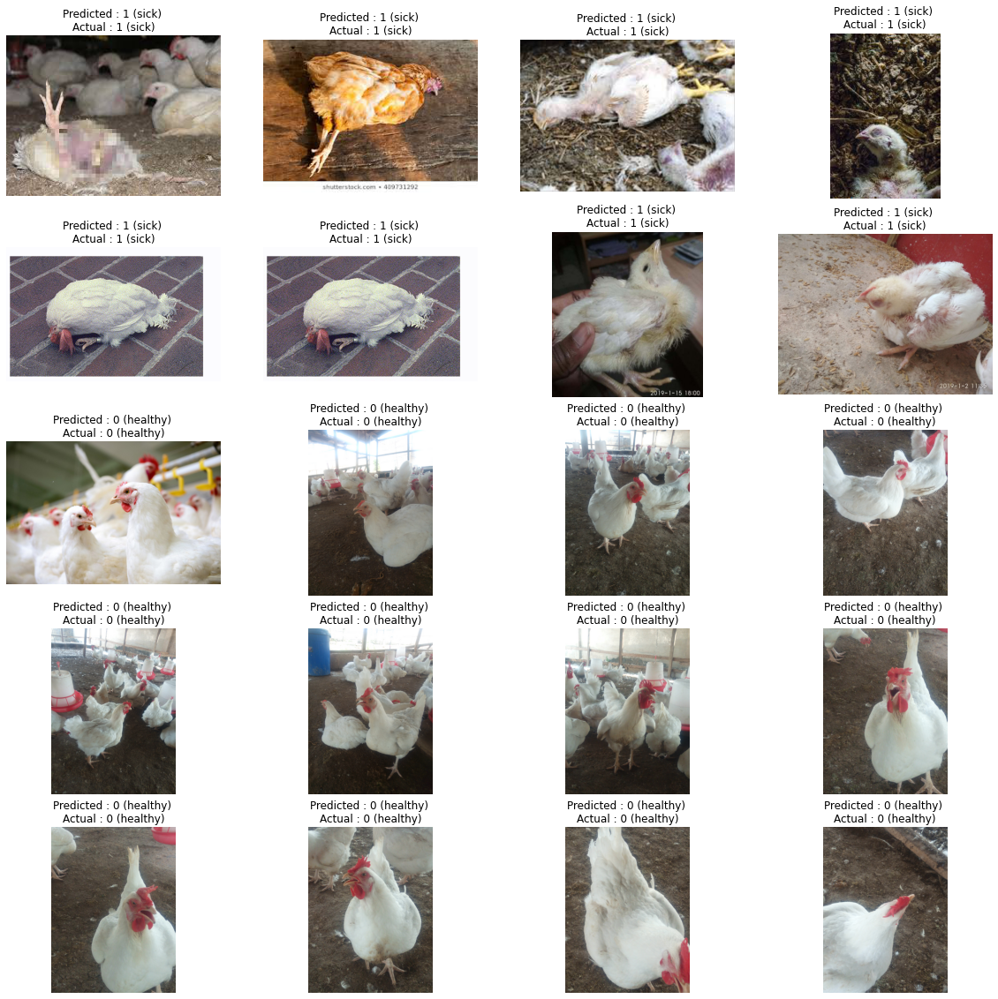

In [100]:
pred = predict(model2, data=temp_images[65:85], y_true=get_labels(temp_images[65:85]), kind="multiple", limit=0, show=True)
y_pred = pred['pred_labels']
y_true = pred['true_labels']

print("\n")
print("\t\t\t\t\tMODEL 2 PREDICTIONS")
print("\t\t\t\t\t*******************\n")
print('\t\tEVALUATION: ', end='\t')
print(f'Accuracy: {np.round(accuracy_score(y_true, y_pred), 2)}', end=',\t')
print(f'Recall: {np.round(recall_score(y_true, y_pred), 2)}', end=',\t')
print(f'Precision: {np.round(precision_score(y_true, y_pred), 2)}', end=',\t')
print(f'F1-Score: {np.round(f1_score(y_true, y_pred), 2)}', end=',\t')
print(f'R2-Score: {np.round(r2_score(y_true, y_pred), 2)}')
#print('ROC_AUC: \t', roc_auc_score(y_true, y_pred, 'ovr'))

In [0]:
# Generates 20 randomly sampled images
sample = np.random.choice(temp_images, 20)



					MODEL 1 PREDICTIONS
					*******************

		EVALUATION: 	Accuracy: 0.9,	Recall: 0.78,	Precision: 1.0,	F1-Score: 0.88,	R2-Score: 0.6


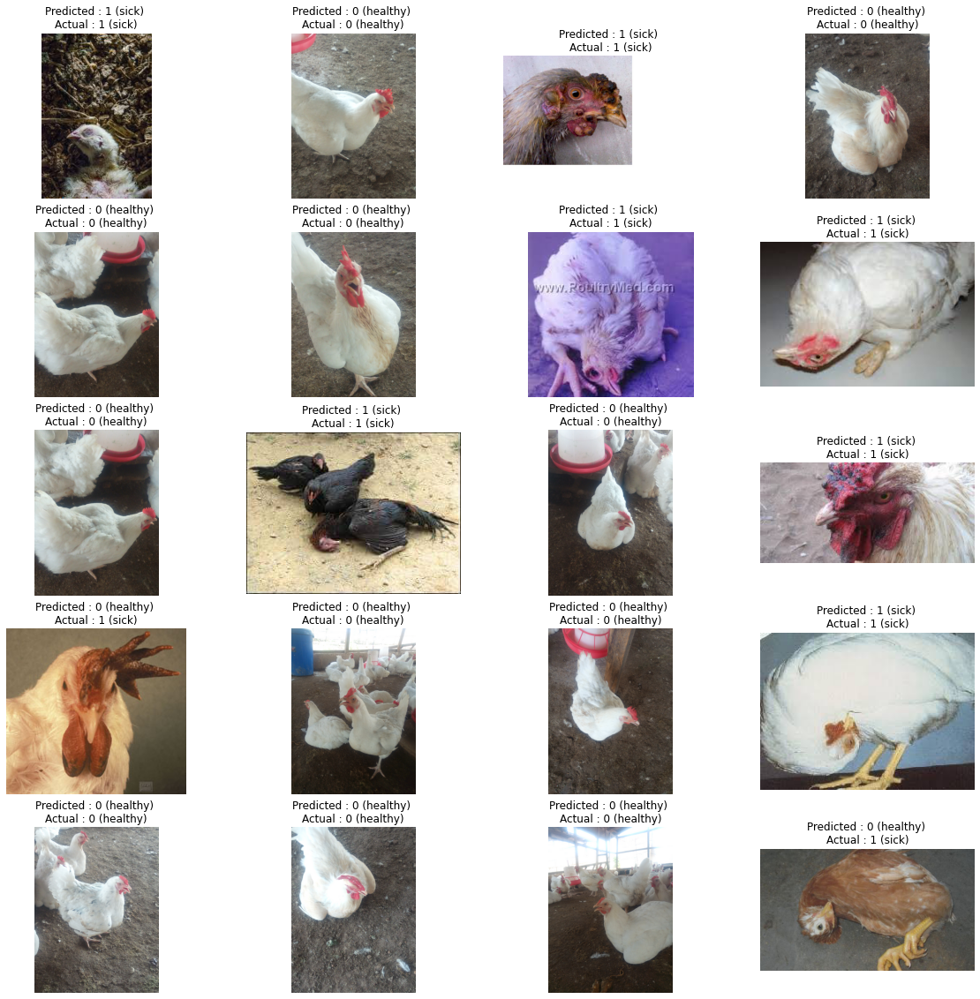

In [101]:
pred = predict(model1, data=sample, y_true=get_labels(sample), kind="multiple", limit=0, show=True)
y_pred = pred['pred_labels']
y_true = pred['true_labels']

print("\n")
print("\t\t\t\t\tMODEL 1 PREDICTIONS")
print("\t\t\t\t\t*******************\n")
print('\t\tEVALUATION: ', end='\t')
print(f'Accuracy: {np.round(accuracy_score(y_true, y_pred), 2)}', end=',\t')
print(f'Recall: {np.round(recall_score(y_true, y_pred), 2)}', end=',\t')
print(f'Precision: {np.round(precision_score(y_true, y_pred), 2)}', end=',\t')
print(f'F1-Score: {np.round(f1_score(y_true, y_pred), 2)}', end=',\t')
print(f'R2-Score: {np.round(r2_score(y_true, y_pred), 2)}')
#print('ROC_AUC: \t', roc_auc_score(y_true, y_pred, 'ovr'))



					MODEL 2 PREDICTIONS
					*******************

		EVALUATION: 	Accuracy: 1.0,	Recall: 1.0,	Precision: 1.0,	F1-Score: 1.0,	R2-Score: 1.0


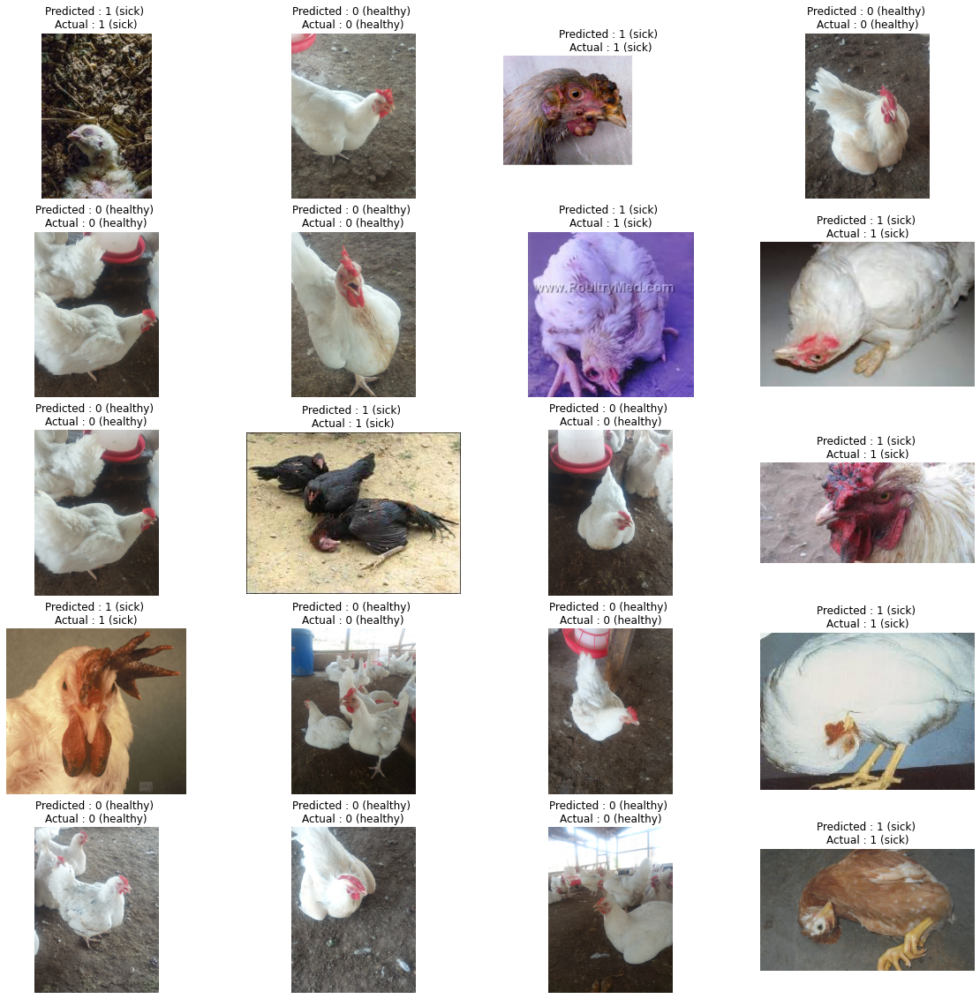

In [102]:

pred = predict(model2, data=sample, y_true=get_labels(sample), kind="multiple", limit=0, show=True)
y_pred = pred['pred_labels']
y_true = pred['true_labels']

print("\n")
print("\t\t\t\t\tMODEL 2 PREDICTIONS")
print("\t\t\t\t\t*******************\n")
print('\t\tEVALUATION: ', end='\t')
print(f'Accuracy: {np.round(accuracy_score(y_true, y_pred), 2)}', end=',\t')
print(f'Recall: {np.round(recall_score(y_true, y_pred), 2)}', end=',\t')
print(f'Precision: {np.round(precision_score(y_true, y_pred), 2)}', end=',\t')
print(f'F1-Score: {np.round(f1_score(y_true, y_pred), 2)}', end=',\t')
print(f'R2-Score: {np.round(r2_score(y_true, y_pred), 2)}')
#print('ROC_AUC: \t', roc_auc_score(y_true, y_pred, 'ovr'))



					MODEL 1 PREDICTIONS (Sick Birds Only)
					*************************************

		EVALUATION: 	Accuracy: 1.0,	Recall: 1.0,	Precision: 1.0,	F1-Score: 1.0,	R2-Score: 1.0


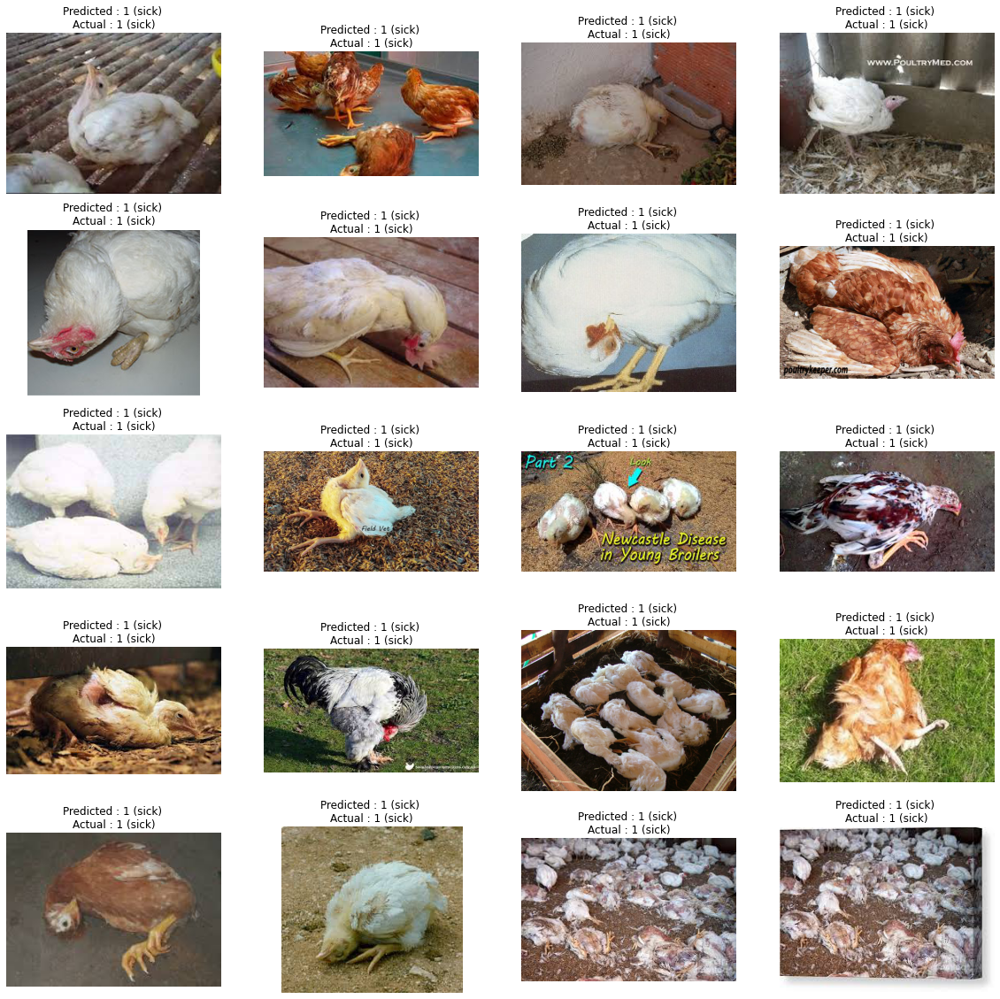

In [104]:
#pred = predict(model1, data=testing_set_aug_images, kind="augumented", limit=16, show=True)
pred = predict(model1, data=temp_images[45:65], y_true=get_labels(temp_images[45:65]), kind="multiple", limit=0, show=True)
y_pred = pred['pred_labels']
y_true = pred['true_labels']

print("\n")
print("\t\t\t\t\tMODEL 1 PREDICTIONS (Sick Birds Only)")
print("\t\t\t\t\t*************************************\n")
print('\t\tEVALUATION: ', end='\t')
print(f'Accuracy: {np.round(accuracy_score(y_true, y_pred), 2)}', end=',\t')
print(f'Recall: {np.round(recall_score(y_true, y_pred), 2)}', end=',\t')
print(f'Precision: {np.round(precision_score(y_true, y_pred), 2)}', end=',\t')
print(f'F1-Score: {np.round(f1_score(y_true, y_pred), 2)}', end=',\t')
print(f'R2-Score: {np.round(r2_score(y_true, y_pred), 2)}')
#print('ROC_AUC: \t', roc_auc_score(y_true, y_pred, 'ovr'))



					MODEL 2 PREDICTIONS (Sick Birds Only)
					*************************************

		EVALUATION: 	Accuracy: 1.0,	Recall: 1.0,	Precision: 1.0,	F1-Score: 1.0,	R2-Score: 1.0


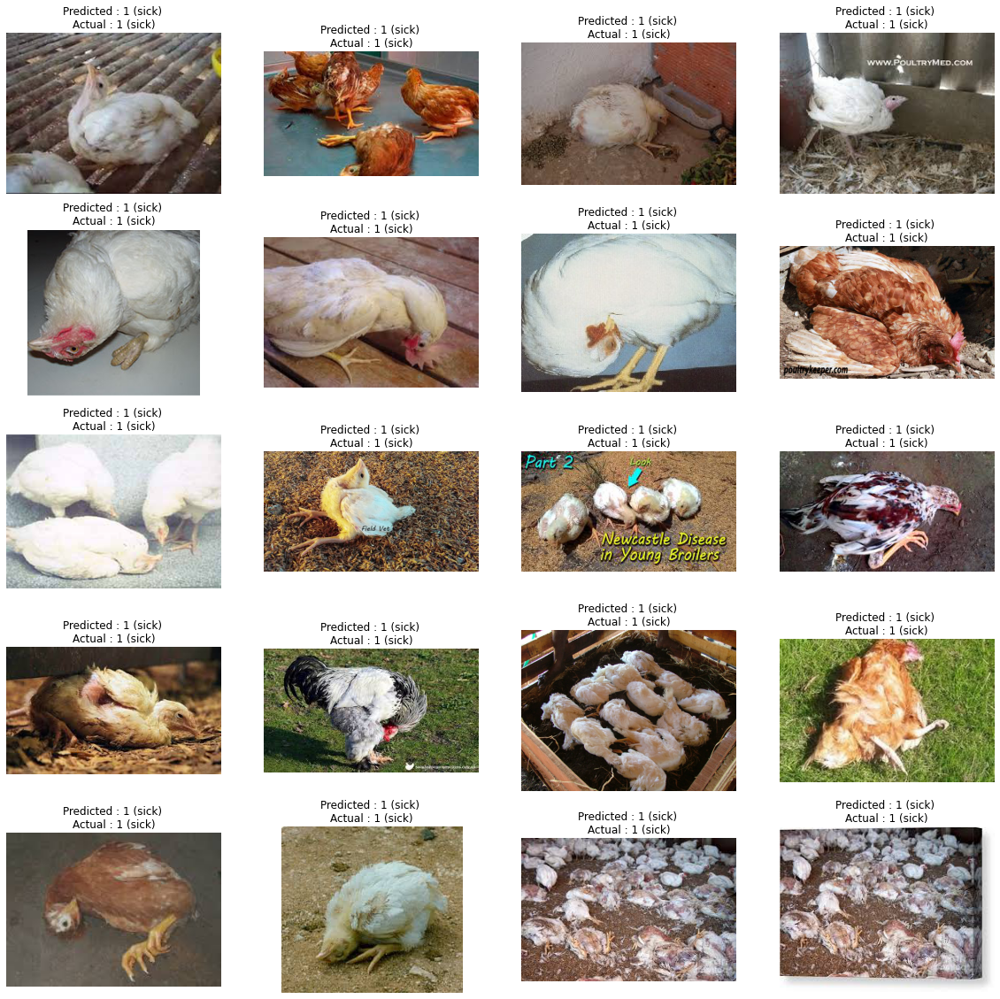

In [105]:
pred = predict(model2, data=temp_images[45:65], y_true=get_labels(temp_images[45:65]), kind="multiple", limit=0, show=True)
y_pred = pred['pred_labels']
y_true = pred['true_labels']

print("\n")
print("\t\t\t\t\tMODEL 2 PREDICTIONS (Sick Birds Only)")
print("\t\t\t\t\t*************************************\n")
print('\t\tEVALUATION: ', end='\t')
print(f'Accuracy: {np.round(accuracy_score(y_true, y_pred), 2)}', end=',\t')
print(f'Recall: {np.round(recall_score(y_true, y_pred), 2)}', end=',\t')
print(f'Precision: {np.round(precision_score(y_true, y_pred), 2)}', end=',\t')
print(f'F1-Score: {np.round(f1_score(y_true, y_pred), 2)}', end=',\t')
print(f'R2-Score: {np.round(r2_score(y_true, y_pred), 2)}')
#print('ROC_AUC: \t', roc_auc_score(y_true, y_pred, 'ovr'))



					MODEL 1 PREDICTIONS (Healthy Birds Only)
					****************************************

		EVALUATION: 	Accuracy: 1.0,	Recall: 1.0,	Precision: 1.0,	F1-Score: 1.0,	R2-Score: 1.0


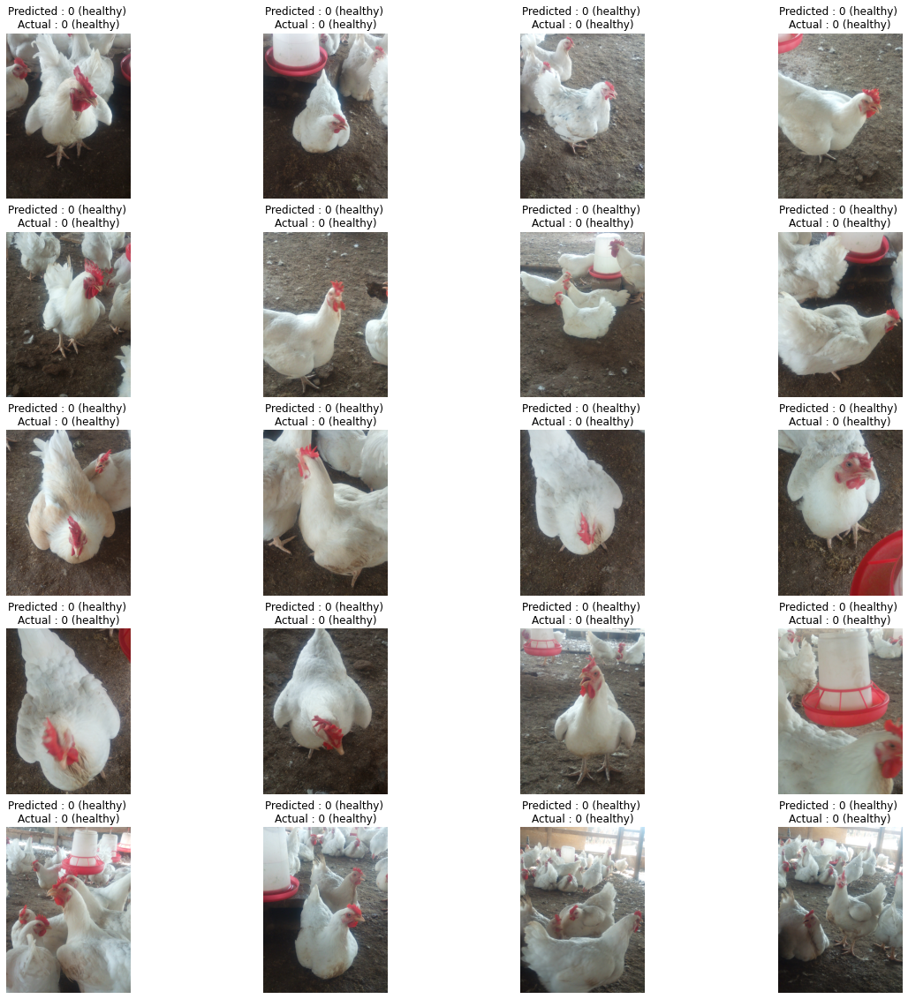

In [27]:
#pred = predict(model1, data=testing_set_aug_images, kind="augumented", limit=16, show=True)
pred = predict(model1, data=temp_images[85:105], y_true=get_labels(temp_images[85:105]), kind="multiple", limit=0, show=True)
y_pred = pred['pred_labels']
y_true = pred['true_labels']

print("\n")
print("\t\t\t\t\tMODEL 1 PREDICTIONS (Healthy Birds Only)")
print("\t\t\t\t\t****************************************\n")
print('\t\tEVALUATION: ', end='\t')
print(f'Accuracy: {np.round(accuracy_score(y_true, y_pred), 2)}', end=',\t')
print(f'Recall: {np.round(recall_score(y_true, y_pred, zero_division=1), 2)}', end=',\t')
print(f'Precision: {np.round(precision_score(y_true, y_pred, zero_division=1), 2)}', end=',\t')
print(f'F1-Score: {np.round(f1_score(y_true, y_pred, zero_division=1), 2)}', end=',\t')
print(f'R2-Score: {np.round(r2_score(y_true, y_pred), 2)}')
#print('ROC_AUC: \t', roc_auc_score(y_true, y_pred, 'ovr'))










					MODEL 2 PREDICTIONS (Healthy Birds Only)
					****************************************

		EVALUATION: 	Accuracy: 1.0,	Recall: 1.0,	Precision: 1.0,	F1-Score: 1.0,	R2-Score: 1.0


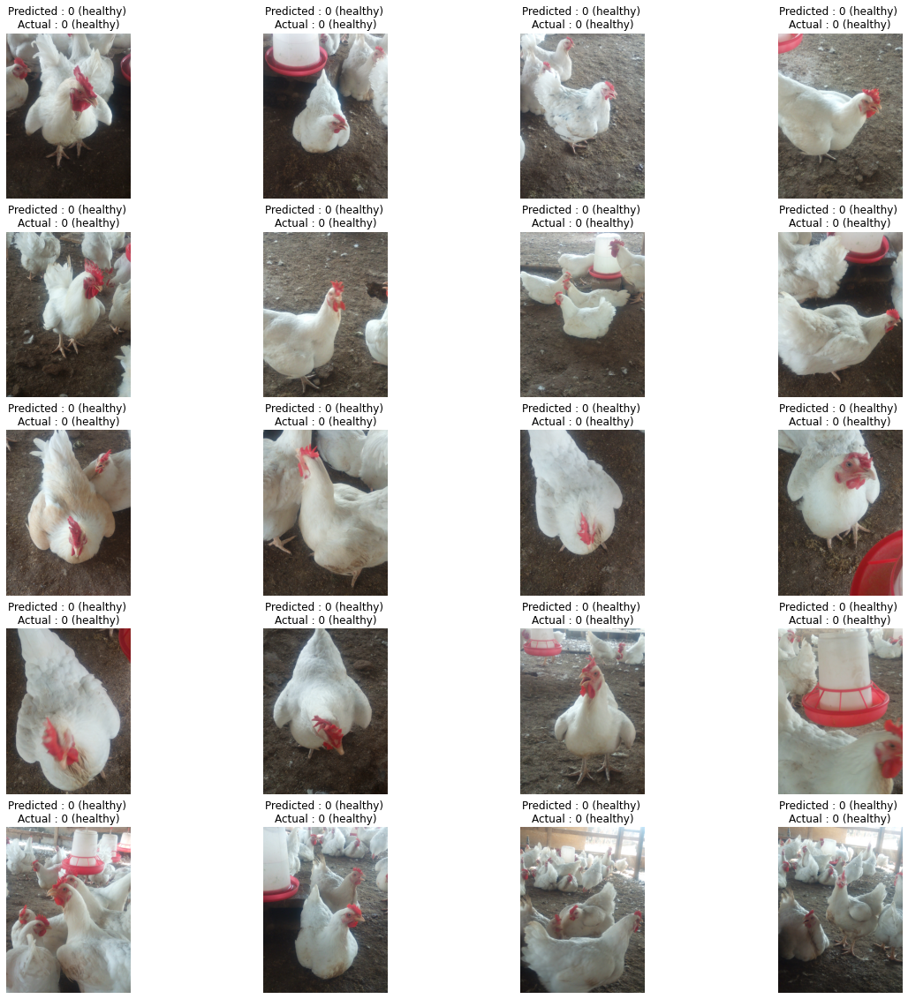

In [28]:
pred = predict(model2, data=temp_images[85:105], y_true=get_labels(temp_images[85:105]), kind="multiple", limit=0, show=True)
y_pred = pred['pred_labels']
y_true = pred['true_labels']

print("\n")
print("\t\t\t\t\tMODEL 2 PREDICTIONS (Healthy Birds Only)")
print("\t\t\t\t\t****************************************\n")
print('\t\tEVALUATION: ', end='\t')
print(f'Accuracy: {np.round(accuracy_score(y_true, y_pred), 2)}', end=',\t')
print(f'Recall: {np.round(recall_score(y_true, y_pred, zero_division=1), 2)}', end=',\t')
print(f'Precision: {np.round(precision_score(y_true, y_pred, zero_division=1), 2)}', end=',\t')
print(f'F1-Score: {np.round(f1_score(y_true, y_pred, zero_division=1), 2)}', end=',\t')
print(f'R2-Score: {np.round(r2_score(y_true, y_pred), 2)}')
#print('ROC_AUC: \t', roc_auc_score(y_true, y_pred, 'ovr'))

# ================= THE END ====================